# Portfolio Project-I: Machine Learning 6CS012-AI and ML 


For this task under the assessment, a classification problem has been selected to extract insights, visualize and then make predictions all of which has been discussed further below.

>But before it all, lets import the ignore warnings filter to get rid of disturbing warnings in the notebook !

In [3]:
import warnings

warnings.filterwarnings("ignore")

>We are now good to go 👍

### Problem Case : Breast Cancer Disease Detection 

In order to perform this task, the open source dataset platform Kaggle was used to access the dataset for a classification problem in order to build a Classifier for predicting the nature of the tumor as either maligant or benign based on certain attributes.

#### Importing The Necessary Python Libraries

In [4]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

#### Importing The Necessary Modules from Sklearn

The below cell consists of all the sklearn libraries that we will be using throughout the project. It includes some modules that helps in building classifiers such as Logistic Regression, KNearest Neighbors Classifier and Random Forest Classifier. 

Alongside that, inorder to best fit the model the hyper parameteres of our relevant models have been tuned to find the best combination using the available search methods for which the model_selection module has been imported. 

Finally, given the expansive nature of the dataset, it was found better fit to incorporate dimensionality reduction techniques into our dataset. Therefore a feature selection method was used to redeem the model from the curse of dimensonality. Given this, the feature_selection module was imported.

Below is the necessary list of imports that is used further.  

In [35]:
# For Train , Test Spliting 
from sklearn.model_selection import train_test_split

# For Building Classifier Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# For Evaluating the Accuray of the Classifiers 
from sklearn.metrics import classification_report , mean_squared_error , confusion_matrix
from sklearn import metrics

# For  Hyper parameter Tuning 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

# For Cross Validation
from sklearn.model_selection import KFold, StratifiedKFold,cross_val_score, cross_val_predict

# For Feature Selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


## 1. Data Understanding and Cleaning

#### Importing The Dataset

In [6]:
dataset= pd.read_csv("data.csv")

#### A look into the Dataset

In [7]:
dataset.head(n=3)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


The above output the top 3 sample data instances present in our dataset.

### About the Dataset

As per the desciption provided in [Kaggle](https://www.kaggle.com/datasets/shubamsumbria/breast-cancer-prediction) , the dataset has been derived from the digital image of FNA of a breast mass.

**Attribute Information:**

* Diagnosis (1 = Maligant ,  0 = Benign )

#### Ten real-valued features computed for each cell nucleus (3–32) referes to the followinh details:

* radius : Distances from the center to points on the perimeter.
* texture : Standard deviation of gray-scale values.
* perimeter 
* area
* smoothness : local variation in radius lengths.
* compactness : perimeter² / area — 1.0.
* concavity : severity of concave portions of the contour.
* concave points : number of concave portions of the contour.
* symmetry
* fractal dimension : “coastline approximation” — 1.

<hr>

#### Dimension Of The Dataset

In [8]:
print(f"Dimension of the dataset is {dataset.shape[1]}")

Dimension of the dataset is 31


#### Checking The Features and Their Types 

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [9]:
print("The columns present in our dataset are as follows : \n")
for col in dataset.columns:
    print(col , end = ", ")

The columns present in our dataset are as follows : 

diagnosis, radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst, 

### Handling Missing Values 

#### Checking The Amount of Null Values By Columns 

In [324]:
dataset.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Turns out there are no null values present in our dataset.

#### Checking The Amount of Missing Values By Columns 

In [325]:
dataset.isna().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Similarly, from the above outputs, we know that there are no missing or null values.

<hr>

# 2. Data Analysis and Visualization

### Checking The Statictical Description of The Dataset

In [10]:
dataset.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


The above output provides a descriptive detail in regards to the statistical features in respect to the attributes present in our dataset.

### Data Visualization

#### Visualizaing the Dataset based on the Diagnosis 

In [11]:
dataset["diagnosis"].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

In [12]:
print("From the above output we know that there are 212 Maligant and 357 Benign classes. ")

From the above output we know that there are 212 Maligant and 357 Benign classes. 


#### Graphical Representation of the Maligant and Benign Diagnosis

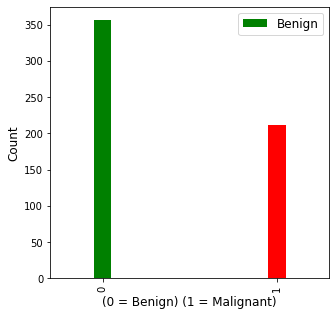

In [13]:
dataset.diagnosis.value_counts().plot(kind="bar", width=0.1, color=["green", "red"], figsize=(5, 5))
plt.xlabel("(0 = Benign) (1 = Malignant)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.legend(["Benign"], fontsize=12)
plt.show()

<AxesSubplot:xlabel='smoothness_mean', ylabel='area_mean'>

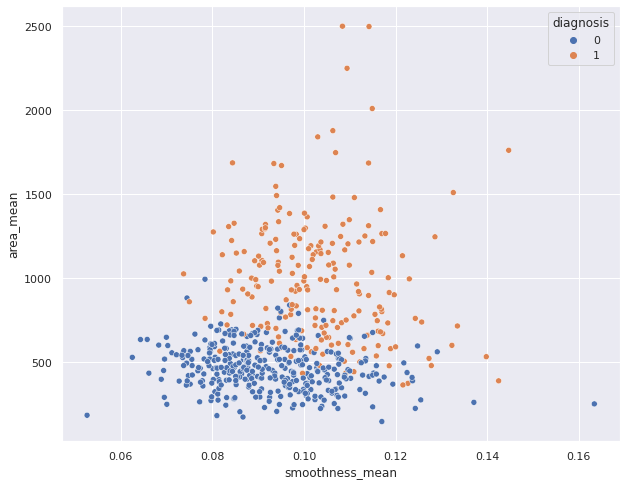

In [327]:
sns.set(rc={"figure.figsize":(10, 8)}) #h,w
sns.scatterplot(x='smoothness_mean',y='area_mean',hue='diagnosis',data =dataset)

From the above visual representation, we can analyze that the instances with area mean approximately in around the range of 800 to 2500 and     smoothness mean from 0.08 to 0.14 is estimated to be of class 1 and the remaininng first half that is 0 to 500 of area mean and 0.07 to 0.12 smoothness mean is computed to be of class 0.

### Plotting A Pair Plot 

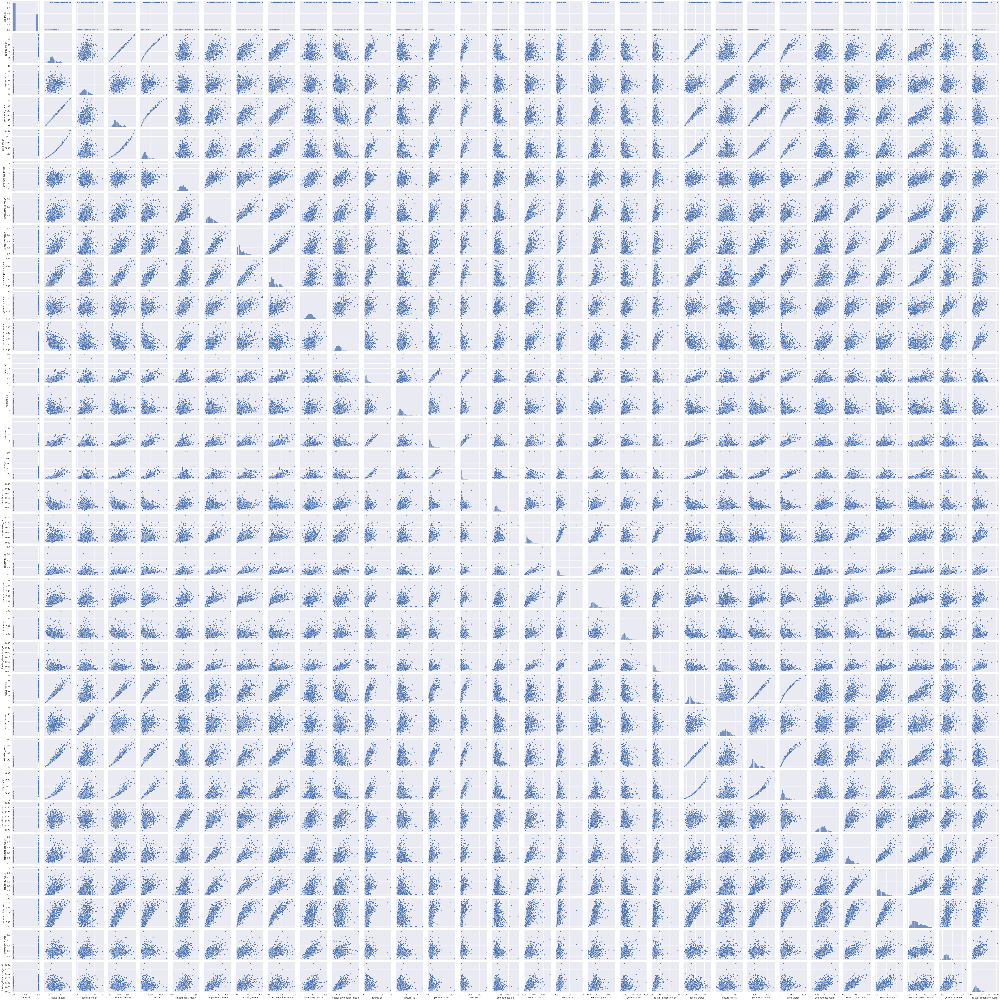

In [14]:
sns.pairplot(dataset)

The above pairplot show the correlations between all the available features present in a dataset with the help of the seaborn library.

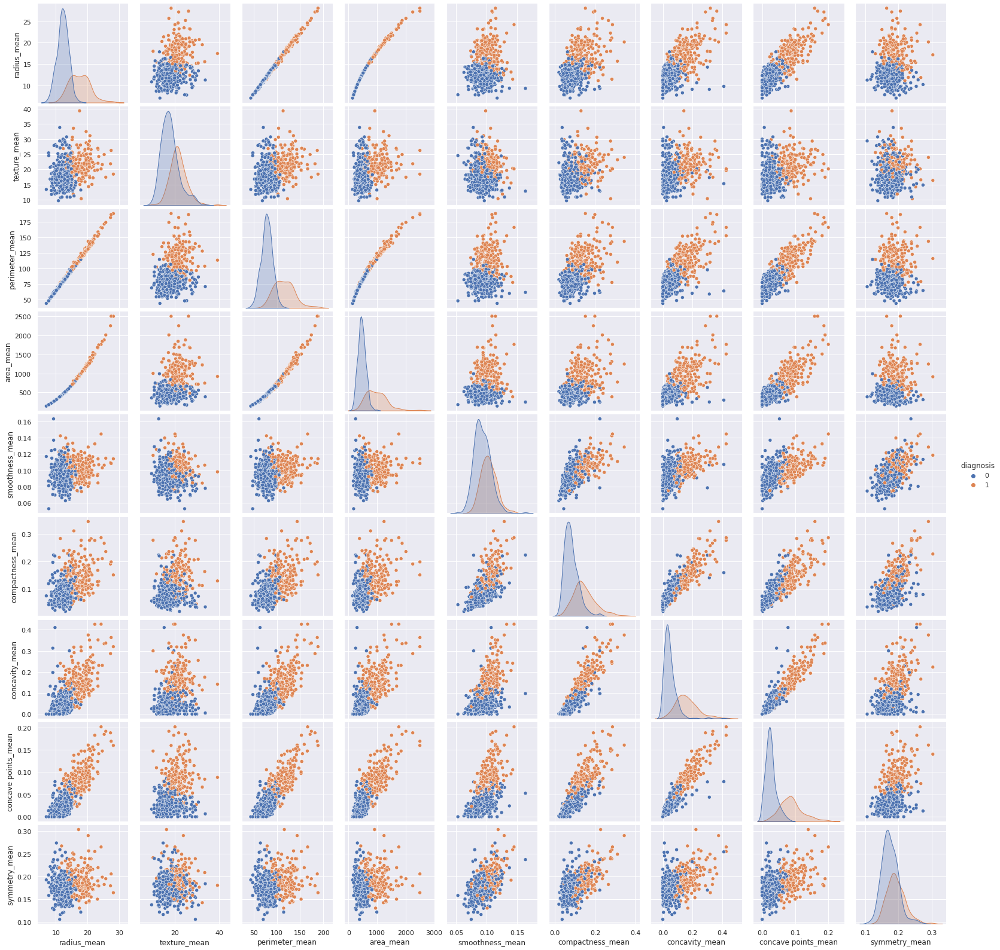

In [15]:
sns.pairplot(dataset ,hue ='diagnosis', vars =['radius_mean','texture_mean', 'perimeter_mean', 'area_mean',
 'smoothness_mean', 'compactness_mean' ,'concavity_mean' , 'concave points_mean', 'symmetry_mean' ]) 

Likewise , the above representation demonstrates the correlation between the above provided features along with a distinct separation in our target classes.

#### Representing The Correlation Between the Features 

<AxesSubplot:>

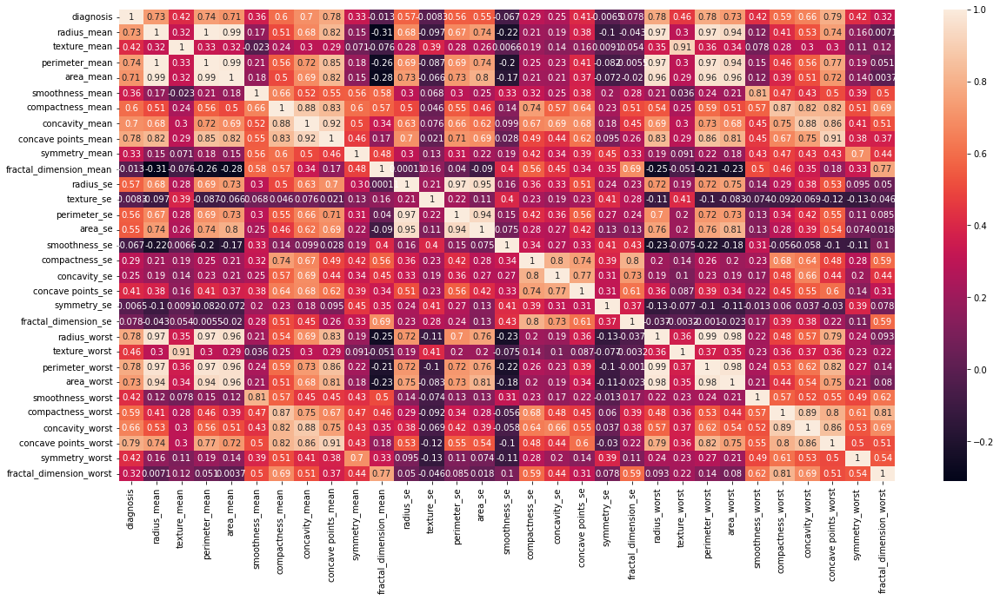

In [14]:
plt.figure(figsize =(20,10))
sns.heatmap(dataset.corr(), annot =True)

Very much similar to the above done approaches, the above heatmap is a more visual and numerically informative representation of the correlationbetween the features.  The principle is that the closer is the correlation value to 1 between the features , the lighter is the shade refering to higher correlation.

#### Visualizing the Range of Area_Mean Values & The Density of Their Values

1.778    4
1.243    2
2.569    2
2.183    2
3.008    2
        ..
2.112    1
1.687    1
1.011    1
1.742    1
2.548    1
Name: perimeter_se, Length: 533, dtype: int64


Text(0, 0.5, 'Density of Instance Value')

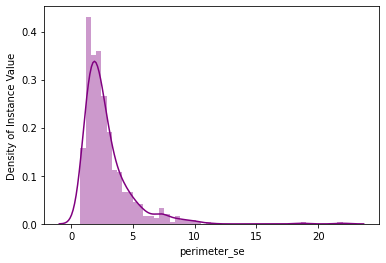

In [15]:
print(dataset['perimeter_se'].value_counts())

sns.distplot(dataset['perimeter_se'],  color ='purple' ,  hist=True)
plt.ylabel("Density of Instance Value")

The above graph displays the range of the perimeter_se present in our dataset along with the mode of respective perimeter_se values.

#### Checking The Maximum Density of Values In Perimeter_Mean

<AxesSubplot:ylabel='perimeter_mean'>

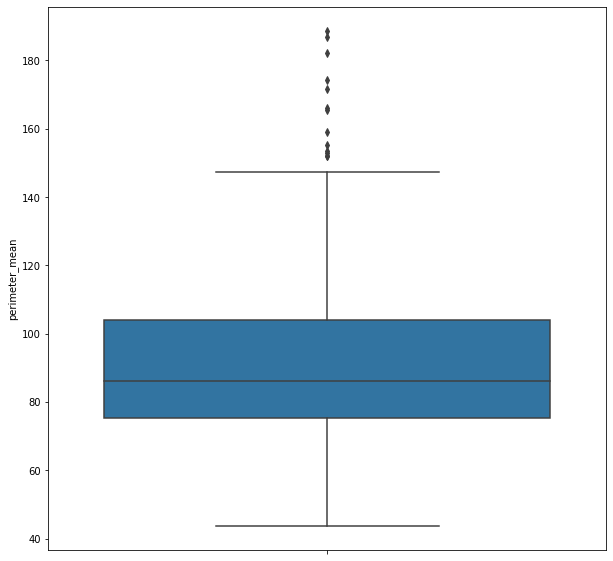

In [16]:
plt.figure(figsize =(10,10))
sns.boxplot(y=dataset['perimeter_mean'])

From the above representation, we know that the feature perimeter_mean has most of the instances ranging from around 75 to 105.

#### Visualizing Texture_Area And Smoothness_Mean

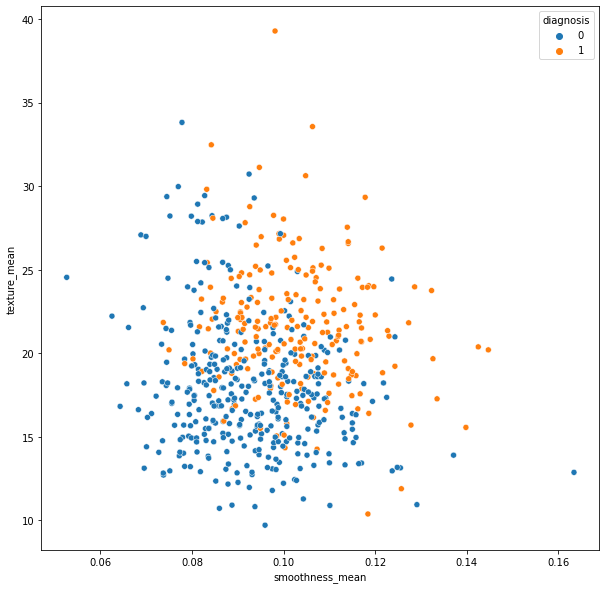

In [17]:
plt.subplots(figsize=(10,10))

sns.scatterplot(x='smoothness_mean',y='texture_mean',hue='diagnosis',data =dataset)
plt.ylabel('texture_mean')
plt.xlabel('smoothness_mean')
plt.show()

Given our primary understanding that the texture refers to the consistency in the surface is something that is somewhat associated to the smoothness factor, the graphical relationship was mapped and it was found that most of the instances with higher texture_mean had higher smoothness_mean value in general.

<hr>

After these understandings of the features, it is now time to build some primary models to solve the initial problem.

## 3. Building A Primary Model 

### Solving The Classification Problem 

In [18]:
X = dataset.drop(['diagnosis'],axis =1)

In [19]:
X.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [20]:
Y = dataset["diagnosis"]

In [21]:
Y.head()

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64

Now, that we have the X and Y that are the independent and dependent variables extarcted from the dataset. Lets work on implementing a supervised 
machine learnig approach to solve the problem. 

#### A Look Into The Target Column Values 

In [22]:
Y.value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

Its evident that the taregt or the output of the above problem is discrete. Therefore, we will further apply the classification approach for predicting the dependednt variables.

### Implementation of Classification Problems 

Some of the Classifiers 
1. Logistic Regression Algorithm 
2. Random Forest Classifier Algorithm 
3. KNN Classifier Algorithm 

We will be implementing the mentioned algorithms, evaluating the models based on the metrices and then at the end picking the best fit models for our problem.

### I. Logistic Regression 

#### Splitting The Dataset Into Different Models

In [23]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

#### Implementing Logistic Regression 

In [24]:
LR_model = LogisticRegression()
LR_model.fit(X_train, Y_train)

LogisticRegression()

#### Making Predictions

In [28]:
Y_pred = LR_model.predict(X_test)

In [32]:
metrics.accuracy_score(Y_test,Y_pred)

0.9210526315789473

#### Evaluating The Model 

**I. Confusion Matrix**

In [33]:
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
rmse

0.28097574347450816

Text(33.0, 0.5, 'Predicted')

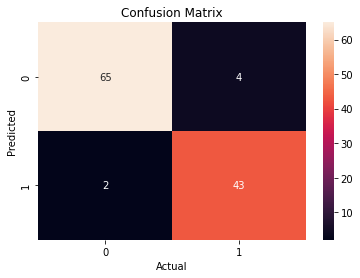

In [47]:
matrix = confusion_matrix(Y_test, Y_pred )
sns.heatmap(matrix, annot=True)

plt.title("Confusion Matrix")
plt.xlabel('Actual')
plt.ylabel('Predicted')

The above matrix shows the performance of our model on a set of test data for which the true values are present. The conclusion that can be drawn from the above matrix are as follows : 

1. There were a total of 64 outcomes that were correctly classified as class 0 (That is class Benign) i.e. TNs = 65
2. There were a total of 5 outcomes that were correctly classified as class 1 (That is class Maligant) i.e. FNs = 4
3. There were 4 outcomes that were incorrectly predicted as class 0 (class Benign) i.e. FPs = 2 
4. There were a total of 41 outcomes that were incorrectly predicted as (class Maligant) i.e. TPs = 43

**II. Classification Report**

In [37]:
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93        69
           1       0.89      0.91      0.90        45

    accuracy                           0.92       114
   macro avg       0.92      0.92      0.92       114
weighted avg       0.92      0.92      0.92       114



### II. Random Forest Classifier 

In [38]:
assert X_train.shape[0] == Y_train.shape[0]

In [49]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

RFC_model = RandomForestClassifier()
RFC_model.fit(X_train, Y_train)

RandomForestClassifier()

In [50]:
Y_pred = RFC_model.predict(X_test)

In [51]:
metrics.accuracy_score(Y_test,Y_pred)

0.9385964912280702

In [58]:
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print(rmse)

0.24779731389167603


At this state , the accuracy of the model without any hyperparameter tunings were recorded.

Text(33.0, 0.5, 'Predicted')

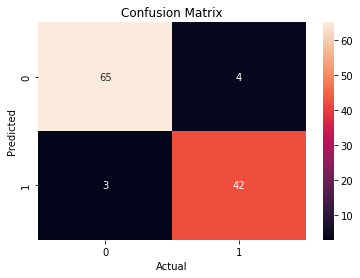

In [61]:
matrix = confusion_matrix(Y_test, Y_pred)
sns.heatmap(matrix, annot=True,)

plt.title("Confusion Matrix")
plt.xlabel('Actual')
plt.ylabel('Predicted')

The conclusion that can be drawn from the above matrix are as follows :

1. There were a total of 64 outcomes that were correctly classified as class 0 (That is class Benign) i.e. TNs = 65
2. There were a total of 5 outcomes that were correctly classified as class 1 (That is class Maligant) i.e. FNs = 4
3. There were 4 outcomes that were incorrectly predicted as class 0 (class Benign) i.e. FPs = 3
4. There were a total of 41 outcomes that were incorrectly predicted as (class Maligant) i.e. TPs = 42

#### Displaying The Classification Report 

In [437]:
print(classification_report(Y_pred, Y_test))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95        68
           1       0.93      0.91      0.92        46

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.94       114
weighted avg       0.94      0.94      0.94       114



### II. K Nearest Neighbors Classifier 

In [438]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

KNNI = KNeighborsClassifier(n_neighbors = 3).fit(X_train, Y_train)
Y_pred = KNNI.predict(X_test)

metrics.accuracy_score(Y_test,Y_pred)

0.9035087719298246

Primarily, all these models were built without any hyperparameter tuning and feature selection methods.

## 4. Cross-validation and Hyper-parameter Tuning

#### Cross Validation Techniques 

#### K-Fold Validation

In [401]:
cv1 = KFold(n_splits= 13, random_state = 12, shuffle=True)    

scores_kfold_rfc = cross_val_score(RFC_model, X, Y, scoring='accuracy',cv=cv1, n_jobs=-1)
scores_kfold_lrc = cross_val_score(LR_model, X, Y, scoring='accuracy',cv=cv1, n_jobs=-1)
scores_kfold_knn = cross_val_score(KNNI, X, Y, scoring='accuracy',cv=cv1, n_jobs=-1)

print("The Kfold Cross Validation for our Random Forest Classifier yields %0.2f accuracy " % (scores_kfold_rfc.mean()))
print("The Kfold Cross Validation for our Logistic Regression Classifier yields %0.2f accuracy " % (scores_kfold_lrc.mean()))
print("The Kfold Cross Validation for our KNN Classifier yields %0.2f accuracy " % (scores_kfold_knn.mean()))

The Kfold Cross Validation for our Random Forest Classifier yields 0.96 accuracy 
The Kfold Cross Validation for our Random Forest Classifier yields 0.94 accuracy 
The Kfold Cross Validation for our KNN Classifier yields 0.93 accuracy 


#### Stratified K-fold Validation

In [403]:
skfold = StratifiedKFold(n_splits=3, random_state=100, shuffle=True)
scores_skfold_ = cross_val_score(RFC_model, X, Y, scoring='accuracy', cv=skfold, n_jobs=-1)
scores_skfold

scores_skfold_rfc = cross_val_score(RFC_model, X, Y, scoring='accuracy',cv=skfold , n_jobs=-1)
scores_skfold_lrc = cross_val_score(LR_model, X, Y, scoring='accuracy',cv=skfold , n_jobs=-1)
scores_skfold_knn = cross_val_score(KNNI, X, Y, scoring='accuracy',cv=skfold , n_jobs=-1)

print("The Kfold Cross Validation for our Random Forest Classifier yields %0.2f accuracy " % (scores_skfold_rfc.mean()))
print("The Kfold Cross Validation for our Logistic Regression Classifier yields %0.2f accuracy " % (scores_skfold_lrc.mean()))
print("The Kfold Cross Validation for our KNN Classifier yields %0.2f accuracy " % (scores_skfold_knn.mean()))


The Kfold Cross Validation for our Random Forest Classifier yields 0.96 accuracy 
The Kfold Cross Validation for our Random Forest Classifier yields 0.94 accuracy 
The Kfold Cross Validation for our KNN Classifier yields 0.93 accuracy 


### Hyperparameters Tuning With RandomizedSearch CV

The hyper parameter tuning is the process of evaluating the best fit hyperparameters set for our model. This is often refered to as search in Machine Learning models and can be categorized into two based on their best fit search patterns. 

#### I. RandomizedSearch CV

This is the kind of search technique that moves around searching the best fit of combination in a random fashion for a fixed set of parameters over a predetermined iterations. This is the best search method incase of many numbers of hyperparameters as it reduces the computation cost. Therefore, as Random Forest Classifier depends on multiple hyperparaemters , we will be using RadomizedSearch CV for this.

In [296]:

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)


random_search = {'criterion': ['entropy', 'gini'],
 'max_depth': list(np.linspace(5, 1200, 10, dtype = int)) + [None],
 'max_features': ['auto', 'sqrt','log2', None],
 'min_samples_leaf': [4, 6, 8, 12],
 'min_samples_split': [3, 7, 10, 14],
 'n_estimators': list(np.linspace(5, 1200, 3, dtype = int))}

model = RandomForestClassifier()

modelrf = RandomizedSearchCV(estimator = model ,param_distributions = random_search, cv = 4, verbose= 5, random_state= 101, n_jobs = -1)

modelrf.fit(X_train, Y_train)


Fitting 4 folds for each of 10 candidates, totalling 40 fits


RandomizedSearchCV(cv=4, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [5, 137, 270, 403, 536,
                                                      668, 801, 934, 1067, 1200,
                                                      None],
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [4, 6, 8, 12],
                                        'min_samples_split': [3, 7, 10, 14],
                                        'n_estimators': [5, 602, 1200]},
                   random_state=101, verbose=5)

After performing the search the best fit hyperparameters for our random forest model are found to be 

In [297]:
modelrf.best_params_

{'n_estimators': 1200,
 'min_samples_split': 14,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 1067,
 'criterion': 'entropy'}

In [298]:
Randomized_YPred =modelrf.predict(X_test)

print(classification_report(Randomized_YPred  , Y_test))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95        68
           1       0.93      0.91      0.92        46

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.94       114
weighted avg       0.94      0.94      0.94       114



In [299]:
metrics.accuracy_score(Y_test, Randomized_YPred)

0.9385964912280702

#### II. GridSearch CV

Next is the GridSearch CV that is used to find the best hyperparameters for our model based on a grid based search. This is implied in the KNN model to find the best fit value for k which is the hyper parameter for that module.

In [439]:


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

params = {'n_neighbors' : list(range(1,10))}

KNN_cv= GridSearchCV(KNNI,params,cv=100)
KNN_cv.fit(X_train,Y_train)
Y_pred  = KNN_cv.predict(X_test)

In [442]:
k = KNN_cv.best_params_.get("n_neighbors")
print(f"The best fit value for k is {k}.")

The best fit value for k is 4.


In [443]:
KNN_cv.best_score_

0.9384999999999999

## 5. Feature Selection

In [444]:
X.shape

(569, 30)

As the dimension of our data at the moment is 30, it is likely that the model we create is going to fall into the limitations of the curse of dimensionality. This can be solved with the use of a technique called Feature selection. This refers to the process of selecting a subset of attributes for efficient model construction.

#### Selecting The K Best Features for Our Dataset

In [411]:

selected_features = [] 

best_features = SelectKBest(chi2 , k = 5)


fit = best_features.fit(X , Y).get_support()

for bool, feature in zip(fit, dataset.columns):
     if bool:
        selected_features.append(feature)
print("The best features are:{}".format(selected_features)) # The list of your 5 best features


The best features are:['texture_mean', 'perimeter_mean', 'perimeter_se', 'texture_worst', 'perimeter_worst']


#### Viewing The Scores of the Top-k Selected Features

In [412]:
feature_scores = {}

for key, value in zip(dataset.columns,best_features.fit(X , Y).scores_):
    feature_scores[key] = value


for key, value in feature_scores.items():
    if key in selected_features:
        print(f"{key} : {value}")

texture_mean : 2011.1028637679099
perimeter_mean : 53991.655923750935
perimeter_se : 8758.504705334488
texture_worst : 3665.0354163405923
perimeter_worst : 112598.43156405367


#### Dropping Unnecessary columns/features from the dataset.

In [306]:
features = dataset[["texture_mean" , "perimeter_mean" , "perimeter_se" , "texture_worst" , "perimeter_worst"]]
target = dataset["diagnosis"]

In [413]:
features.head()

,texture_mean,perimeter_mean,perimeter_se,texture_worst,perimeter_worst
0,10.38,122.80,8.589,17.33,184.60
1,17.77,132.90,3.398,23.41,158.80
2,21.25,130.00,4.585,25.53,152.50
3,20.38,77.58,3.445,26.50,98.87
4,14.34,135.10,5.438,16.67,152.20


In [414]:
target.head()

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64

In [415]:
assert features.shape[0] == target.shape[0]

## 6. Final Model 

#### Implementing KNN in our selected features using the bestfit hyper-parameters 

In [420]:
X_train , X_test , Y_train , Y_test  = train_test_split(features , target , test_size = 0.33 , random_state = 42)

KNN_model = KNeighborsClassifier(n_neighbors = k).fit(X_train , Y_train)

In [421]:
Y_pred = KNN_model.predict(X_test)
Y_pred

array([0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0])

In [422]:
metrics.accuracy_score(Y_test, Y_pred)

0.9574468085106383

The accuracy of KNN model after hyperparameter tuning has increased. 

#### Implementing RandomForest Classifier in our selected features using the bestfit hyper-parameters 

In [446]:
X_train , X_test , Y_train , Y_test  = train_test_split(features , target , test_size = 0.33 , random_state = 42)

model_rf = RandomForestClassifier()

RF_Model = RandomizedSearchCV(estimator = model_rf ,param_distributions = random_search, cv = 4, verbose= 5, random_state= 101, n_jobs = -1)

RF_Model.fit(X_train, Y_train)


Fitting 4 folds for each of 10 candidates, totalling 40 fits


RandomizedSearchCV(cv=4, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [5, 137, 270, 403, 536,
                                                      668, 801, 934, 1067, 1200,
                                                      None],
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [4, 6, 8, 12],
                                        'min_samples_split': [3, 7, 10, 14],
                                        'n_estimators': [5, 602, 1200]},
                   random_state=101, verbose=5)

In [447]:
Y_pred = RF_Model.predict(X_test)
metrics.accuracy_score(Y_test , Y_pred)

0.9574468085106383

The accuracy of Random Forest Classifier has also increased after hyperparameter tuning over the selected features.

## 7. Conclusion


To sum up, initially a datset that consisted of the features or details related to the infected cells present in the breast were selected and understood better with the use of available python pandas library.  After that , the matplotlib and seaborn libraries were used to visually represent or map the relationship between various features present in our dataset. 

Now, after that the first primary models on classification algorithms such as Logistic Regression, KNN Classifier and Random Forest Classifier were built using the sklearn library and evaluated using the available metrics. 

After understanding the need of the cross validation for building these models, all of these primary models were rebuilt using the K-fold and Stratified Cross Validation techniques and likewise the accuracies were checked. Both the cross validation techniques , seemed to impact the accuracy of the model in an uniform manner with **Random Forest Classifier with the highest accuracy** here.

Next, was the turn to pick the best fit combination of hyperparameters for our Random Forest and KNN classifiers. Therefore, RandomizedSearch CV and GridSearch CV was used respectively to find the best combination of parameters for our models for better result. 

Derived Best Fit Hyper Parameters for Random Forest  : 

{'criterion': 'entropy', 'gini'        , <br>
 'max_depth': 5, 137, 270, 403, 536,  668, 801, 934, 1067, 1200, None , <br>
 'max_features': 'auto', 'sqrt', 'log2',   None, <br>
  'min_samples_leaf': 4, 6, 8, 12,<br>
 'min_samples_split': 3, 7, 10, 14,<br>
 'n_estimators': 5, 602, 1200 }
                
Derived Best Fit Hyper Parameters for KNN Classifier  : 

{'n_neighbors' : 4}

Finally after finding the best tuning hyper parameters for the model , the curse of dimensionality was taken into consideration and the SelectKbest feature selection technique was used to select top 5 best features from the dataset based on their scores. 

The best features were 'texture_mean', 'perimeter_mean', 'perimeter_se', 'texture_worst' and  'perimeter_worst'.

**Finally,** after the implementation of all these refinement techniques the primarily built models were rebult by plugging in the best fit hyperparameters and selected features. **Performing this demonstrated an increase in the accuracy of the models but both our classifiers that are Random Forest And KNN appear to hold the same amount of accuracy at the end.**